In [1]:
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import keras
import tensorflow as tf
import tensorflow_datasets as tfds
keras.__version__
tf.__version__

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.set_visible_devices(gpus[0], 'GPU')
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)

2024-11-04 16:50:13.785883: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


(train_ds, test_ds), info = tfds.load(
    "tf_flowers", split=['train[:80%]', 'train[80%:]'], as_supervised=True,
    with_info=True
)

In [3]:
(train_ds, test_ds), info = tfds.load(
    "tf_flowers", split=['train[:80%]', 'train[80%:]'], as_supervised=True,
    with_info=True
)

In [4]:
print(info)

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='/Users/perish/tensorflow_datasets/tf_flowers/3.0.1',
    file_format=tfrecord,
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)


In [8]:
h = 64
w = 64

resize_layer = tf.keras.layers.Resizing(height=h, width=w)

def resize_image(image, label):
  image = resize_layer(image)
  return image, label

train_ds = train_ds.map(resize_image)
test_ds = test_ds.map(resize_image)

In [10]:
train_image = []
train_label = []
test_image = []
test_label = []

for image, label in train_ds:
  train_image.append(image)
  train_label.append(label)

for image, label in test_ds:
  test_image.append(image)
  test_label.append(label)

train_image = np.array(train_image)/255
train_label = np.array(train_label)
test_image = np.array(test_image)/255
test_label = np.array(test_label)

2024-11-04 16:50:33.375048: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-11-04 16:50:34.115577: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [12]:
base_model = tf.keras.applications.EfficientNetB0(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

base_model.trainable = True
model2 = tf.keras.Sequential([
    keras.layers.Input(shape=(64, 64, 3)),
    base_model,
    keras.layers.Flatten(),
    keras.layers.Dense(32, activation="relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(5,activation="softmax")
])

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [14]:
model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001),
              loss="sparse_categorical_crossentropy",
              metrics=['accuracy']
             )
model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 2, 2, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5120)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       163,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           165 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,213,608 (16.07 MB)

 Trainable params: 4,171,585 (15.91 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
h2 = model2.fit(train_image, train_label, batch_size=128, epochs=50, validation_data=(test_image, test_label))

Epoch 1/50
11/23 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.2084 - loss: 2.1740

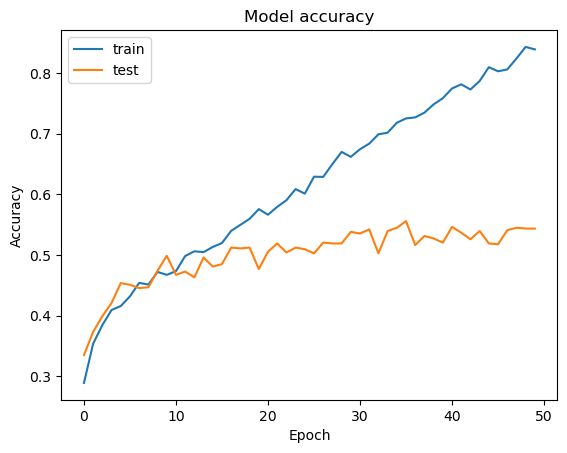

In [93]:
plt.plot(h2.history['accuracy'])
plt.plot(h2.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


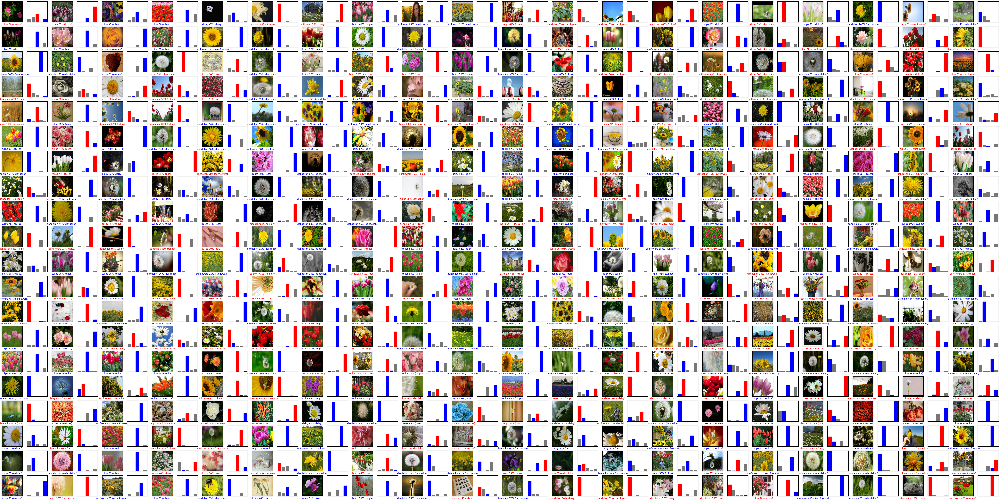

In [90]:
predictions = model2.predict(test_image)
class_names = [
    "dandelion",
    "daisy",
    "tulips",
    "sunflowers",
    "roses"
]

def plot_image(i, predictions_array, true_label, img):
    predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.imshow(img, cmap=plt.cm.binary)

    predicted_label = np.argmax(predictions_array)
    if predicted_label == true_label:
        color = "blue"
    else:
        color = "red"

    plt.xlabel(
        "{} {:2.0f}% ({})".format(
            class_names[predicted_label],
            100 * np.max(predictions_array),
            class_names[true_label],
        ),
        color=color,
    )

def plot_value_array(i, predictions_array, true_label):
    predictions_array, true_label = predictions_array[i], true_label[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    thisplot = plt.bar(range(5), predictions_array, color="#777777")
    plt.ylim([0, 1])
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color("red")
    thisplot[true_label].set_color("blue")

num_rows = 20
num_cols = 20
num_images = num_rows * num_cols
plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, predictions, test_label, test_image)
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, predictions, test_label)

In [94]:
loss, accuracy = model2.evaluate(test_image, test_label)

print(f"Accuracy: {accuracy * 100:.2f}%")

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5523 - loss: 1.4453
Accuracy: 54.36%
